Assignment 3 - EP20BTECH11004

In [1]:
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import time

Part 1 - Periodic Convolution

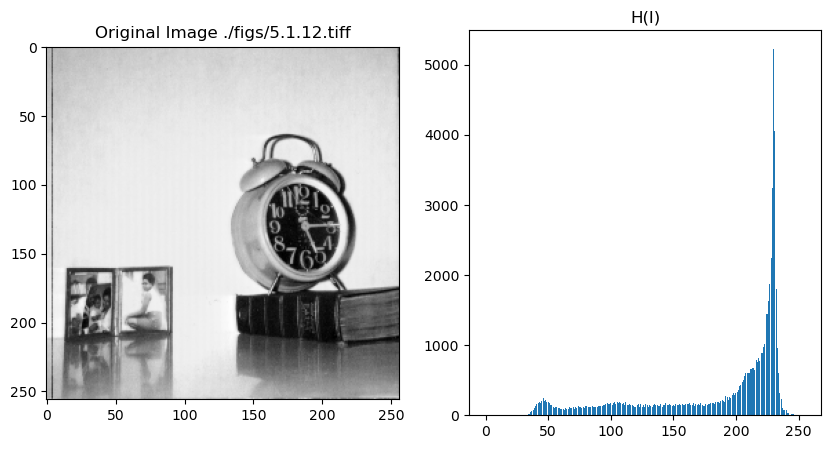

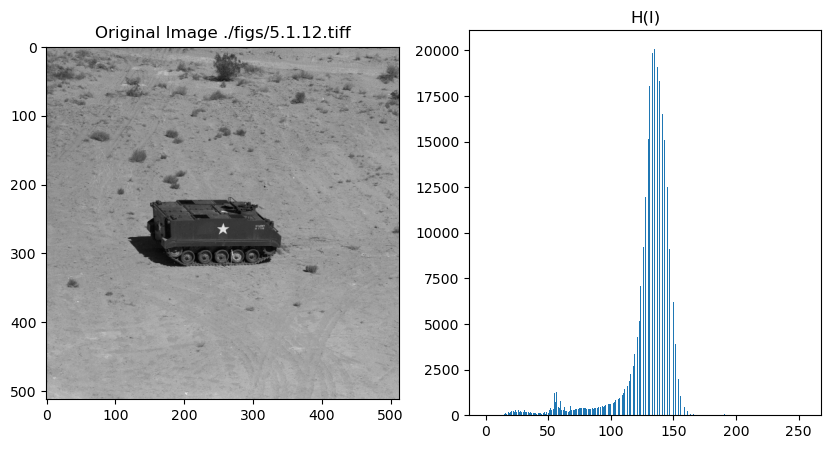

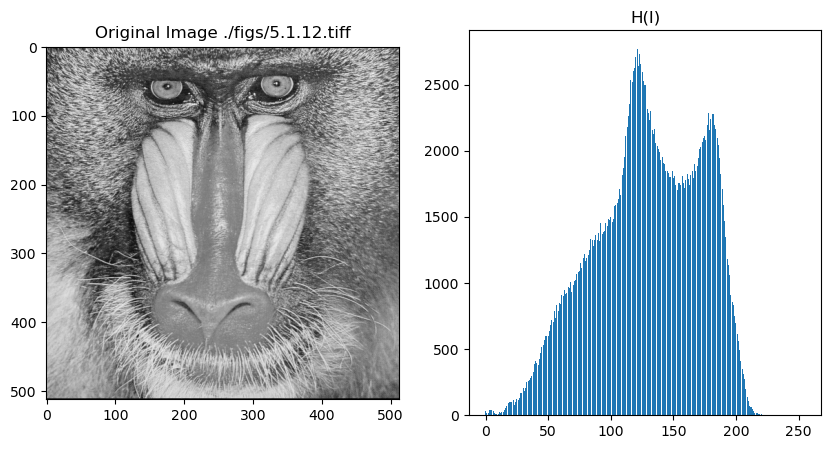

In [2]:
def Mat_DFT(I):
    N = len(I)
    w = np.exp(-2j * np.pi / N)
    W = 1j * np.zeros((N, N))
    
    for i in range(N):
        for j in range(N):
            W[i][j] = np.power(w, (i * j))
            
    F = np.matmul(W, np.matmul(I, W))
    return F

def Mat_IDFT(I):
    N = len(I)
    w = np.exp(-2j * np.pi / N)
    W = 1j * np.zeros((N, N))
    
    for i in range(N):
        for j in range(N):
            W[i][j] = np.power(w, (i * j))
    W_inv = np.linalg.inv(W)
    
    f = np.matmul(W_inv, np.matmul(I, W_inv))
    return np.round(f).real

folder = './figs/'
filenames = ['5.1.12.tiff', '7.1.08.tiff', '4.2.03.tiff']
files = [folder + file for file in filenames]

def hist(I):
    X = np.zeros(256, dtype = int)
    for j in I.flatten():
        X[j] += 1
    return X

for file in files:
    I = np.asarray(Image.open(file).convert('L')).astype(int)
    fig, axs = plt.subplots(1, 2, figsize=(10, 5))
    axs[0].imshow(I, cmap = 'gray')
    axs[0].set_title('Original Image ' + files[0])
    axs[1].bar(np.arange(256), hist(I))
    axs[1].set_title('H(I)')
    plt.show()

Q1

In [3]:
img = np.asarray(Image.open(files[0]).convert('L')).astype(int)

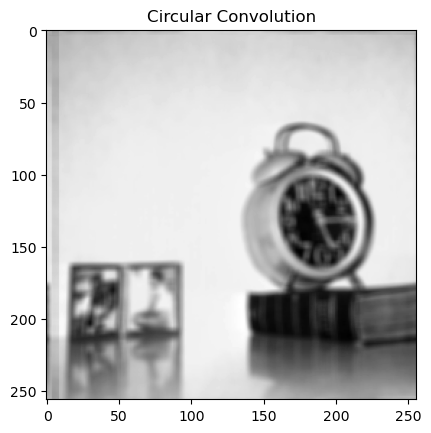

In [4]:
def filters(x):
    return  np.ones((x, x)) * (1/(x ** 2))

filter = filters(5)

def cirConv(img, filter):
  M, N = img.shape
  P, Q = filter.shape

  out = np.zeros((M, N))

  for m in range(M):
    for n in range(N):
      for p in range(P):
        for q in range(Q):
          out[m][n] += filter[p][q] * img[(m - p) % M][(n - q) % N]

  return np.round(out).astype(int)

img_circonv = cirConv(img, filter)

plt.imshow(img_circonv, cmap = 'gray')
plt.title('Circular Convolution')
plt.show()

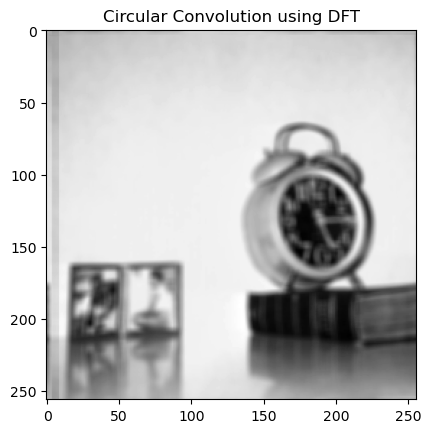

IDFT of the product of the image DFT and filter DFT results in circular convolution


In [5]:
def DFT_cirConv(img, filter):
  M, N = img.shape
  P, Q = filter.shape

  filter_pad = np.zeros((M , N))
  filter_pad[:P, :Q] = filter

  DFT_img = Mat_DFT(img)
  DFT_filter = Mat_DFT(filter_pad)
  out = Mat_IDFT(np.multiply(DFT_img, DFT_filter))

  return np.round(out).astype(int)

img_circonv_dft = DFT_cirConv(img, filter)

plt.imshow(img_circonv_dft, cmap = 'gray')
plt.title('Circular Convolution using DFT')
plt.show()

if np.array_equal(img_circonv, img_circonv_dft):
  print('IDFT of the product of the image DFT and filter DFT results in circular convolution')

Q2

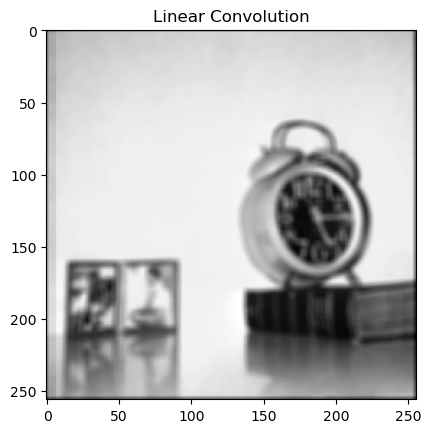

In [6]:
def linConv(img, filter):
  M, N = img.shape
  P, Q = filter.shape

  img_pad = np.zeros((M + P - 1, N + Q - 1))
  img_pad[:M, :N] = img

  out = cirConv(img_pad, filter)

  return out[P//2 : P//2 + M, Q//2 : Q//2 + N]

img_linconv = linConv(img, filter)

plt.imshow(img_linconv, cmap = 'gray')
plt.title('Linear Convolution')
plt.show()

Q3

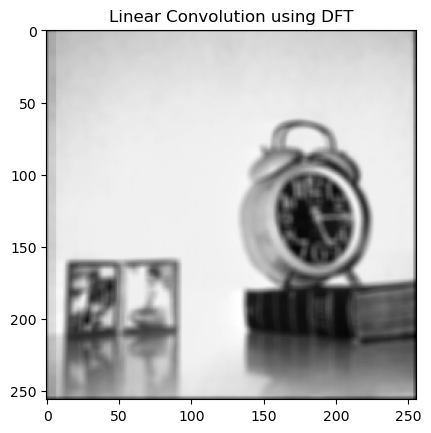

In [7]:
def linConv_dft(img, filter):
    M, N = img.shape
    P, Q = filter.shape

    img_pad = np.zeros((M + P - 1, N + Q - 1))
    img_pad[:M, :N] = img

    filter_pad = np.zeros((M + P - 1, N + Q - 1))
    filter_pad[:P, :Q] = filter

    DFT_img = Mat_DFT(img_pad)
    DFT_filter = Mat_DFT(filter_pad)

    out = Mat_IDFT(np.multiply(DFT_img, DFT_filter))

    return out[P//2 : P//2 + M, Q//2 : Q//2 + N]

img_linconv_dft = linConv_dft(img, filter)

plt.imshow(img_linconv_dft, cmap = 'gray')
plt.title('Linear Convolution using DFT')
plt.show()
    

For filter size 3 and below, Direct linear convolution is faster than the IDFT-DFT approach


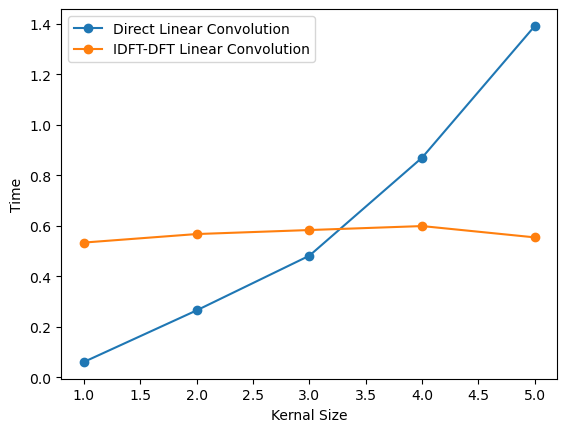

In [8]:
times1 = []
times2 = []
flag = 0

for x in range(1,6):
    filter = filters(x)
    tic1 = time.time()
    linConv(img, filter)
    tac1 = time.time()
    t1 = tac1 - tic1
    tic2 = time.time()
    linConv_dft(img, filter)
    tac2 = time.time()
    t2 = tac2 - tic2
    times1.append(t1)
    times2.append(t2)
    
    if t2 < t1 and flag == 0:
        print(f'For filter size {x - 1} and below, Direct linear convolution is faster than the IDFT-DFT approach')
        flag = 1

plt.plot(range(1,6), times1, label = 'Direct Linear Convolution', marker = 'o')
plt.plot(range(1,6), times2, label = 'IDFT-DFT Linear Convolution', marker = 'o')
plt.xlabel('Kernal Size')
plt.ylabel('Time')
plt.legend()
plt.show()

For Low filter Sizes Direct Linear Convolution is faster, otherewise IDFT-DFT approach is much faster.

Part 2 - Linear Image Filters

In [9]:
def cirConvDFT(img, filter):
  M, N = img.shape
  P, Q = filter.shape

  filter_pad = np.zeros((M , N))
  filter_pad[:P, :Q] = filter

  DFT_img = Mat_DFT(img)
  DFT_filter = Mat_DFT(filter_pad)
  out = np.multiply(DFT_img, DFT_filter).real

  return np.round(out).astype(int)

img = I

Q1

Averaging filter has only one parameter: 'Kernal Size'

Filter Size: 2


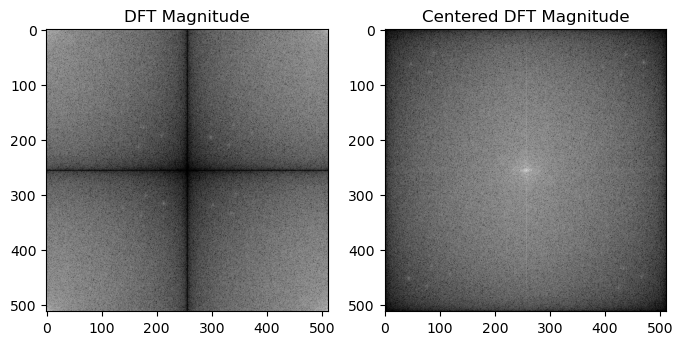

Filter Size: 7


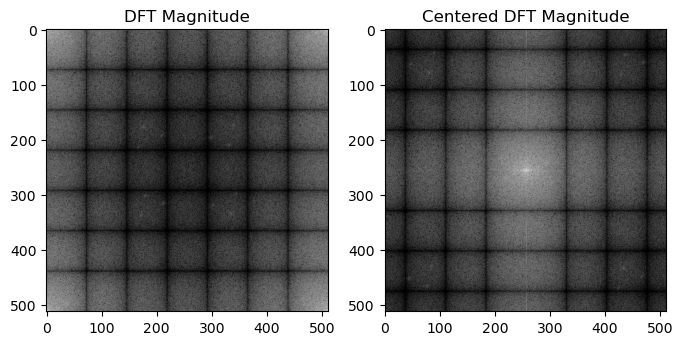

Filter Size: 12


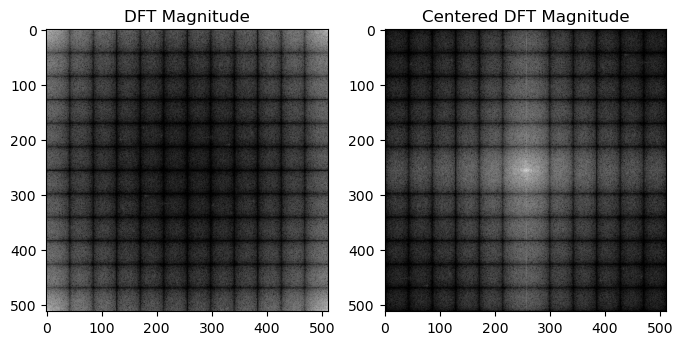

Filter Size: 17


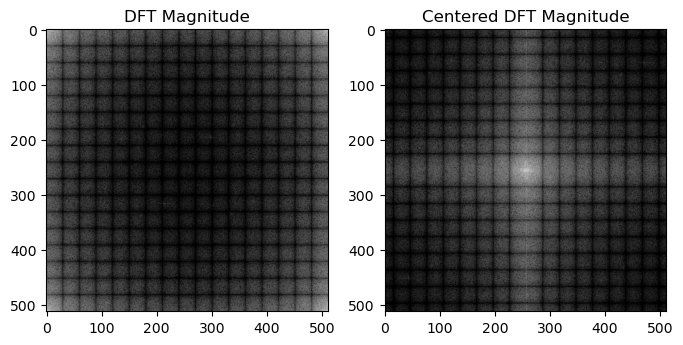

Filter Size: 22


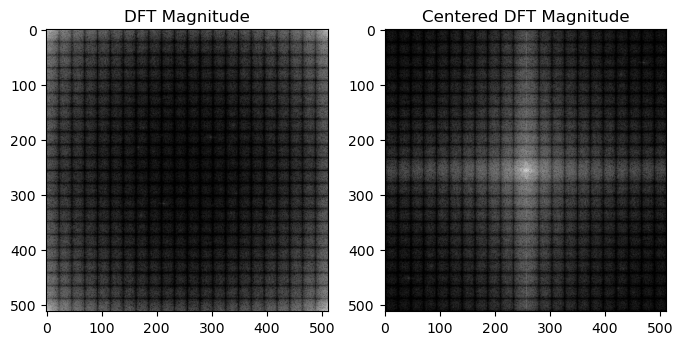

Filter Size: 27


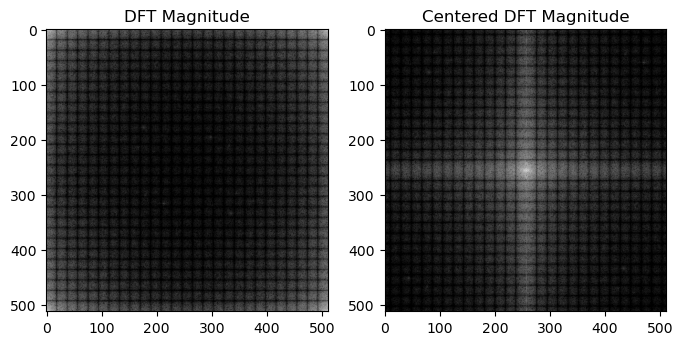

Filter Size: 32


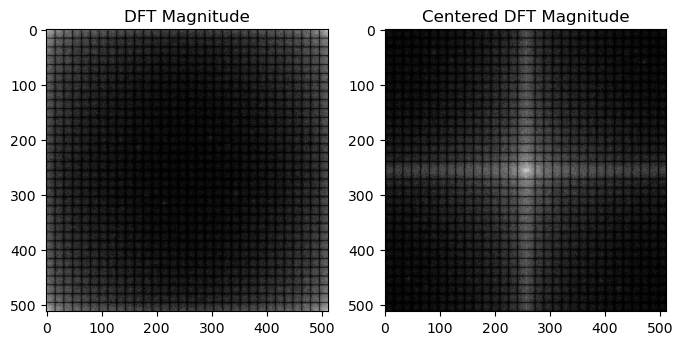

Filter Size: 37


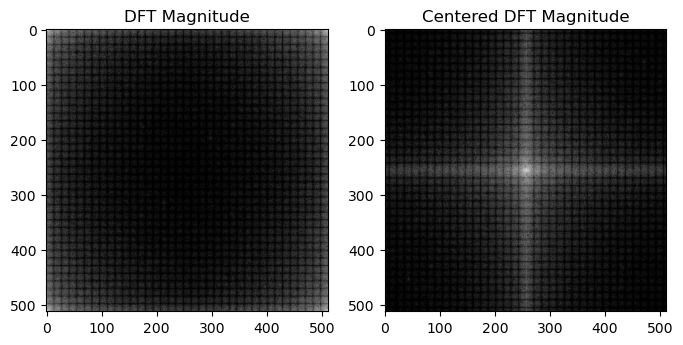

Filter Size: 42


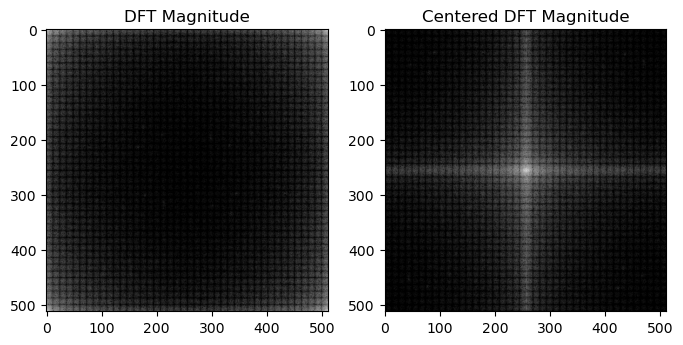

Filter Size: 47


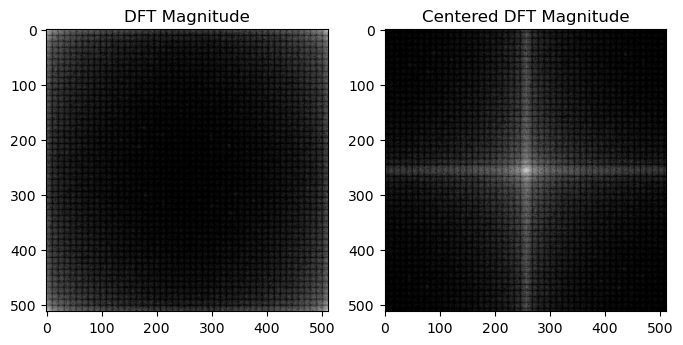

In [10]:
for x in range(2, 50, 5):
    print(f'Filter Size: {x}')
    filter = filters(x)
    img_cirConvDFT = cirConvDFT(img, filter) 
    img_mag = np.absolute(img_cirConvDFT)
    img_log = np.log(1 + img_mag)
    img_cent = np.fft.fftshift(img_log)
    fig, axs = plt.subplots(1, 2, figsize=(8, 4))
    axs[0].imshow(img_log, cmap = 'gray')
    axs[0].set_title('DFT Magnitude')
    axs[1].imshow(img_cent, cmap = 'gray')
    axs[1].set_title('Centered DFT Magnitude')
    plt.show() 


The centered DFT spectrum (Bright in the center, dark away from the center) confirms that the Averaging filter functions as a low-pass filter.

From the centered DFT spectrum, it is evident that increasing the parameter, filter size, leads to a decrease in the cutoff frequency.

Q2

The parameters of a gaussian filter are Kernal Size and Variance (Standard Deviation).

In [11]:
def gauss_filter(size, sig):
    x, y = np.indices([size, size]) - (size // 2)
    gauss = np.exp(-0.5 * ((x**2) + (y**2)) / sig**2)
    gauss /= gauss.sum()

    return gauss

Variance: 0.5, Filter Size: 2


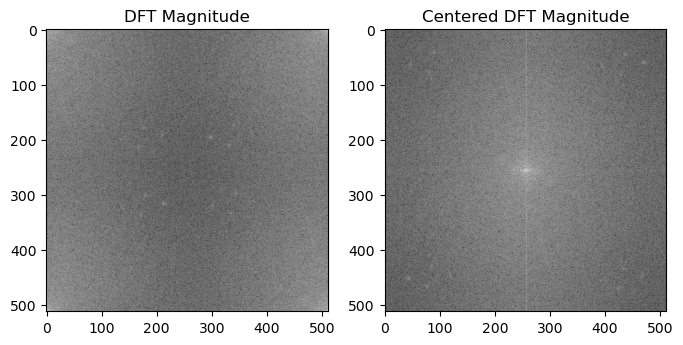

Variance: 0.5, Filter Size: 10


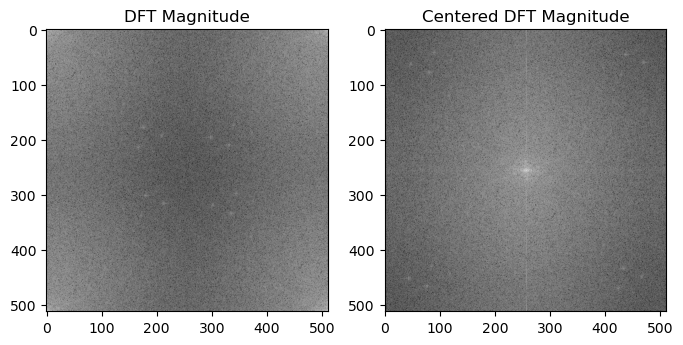

Variance: 0.5, Filter Size: 30


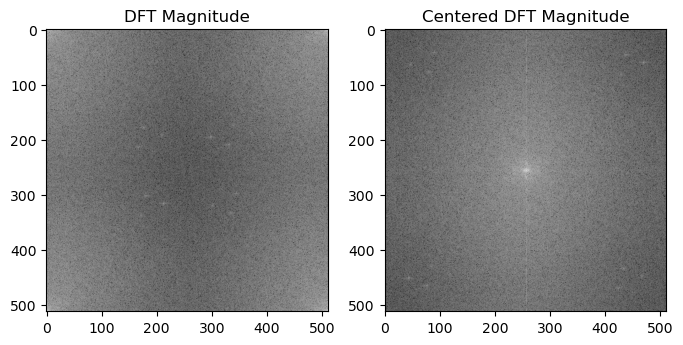

Variance: 1, Filter Size: 2


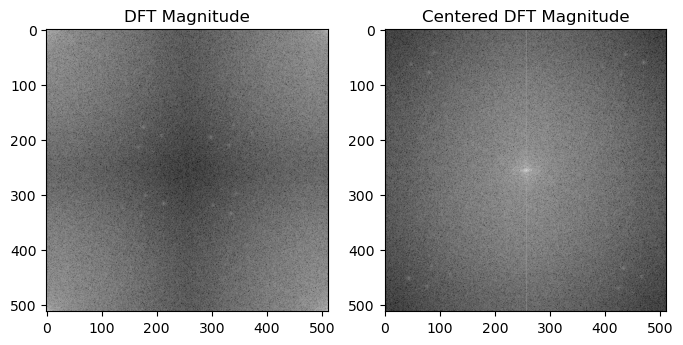

Variance: 1, Filter Size: 10


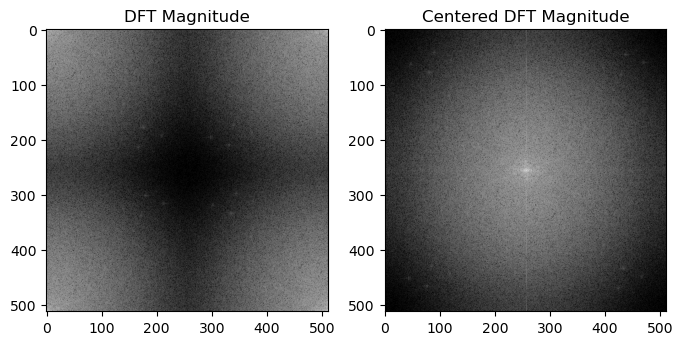

Variance: 1, Filter Size: 30


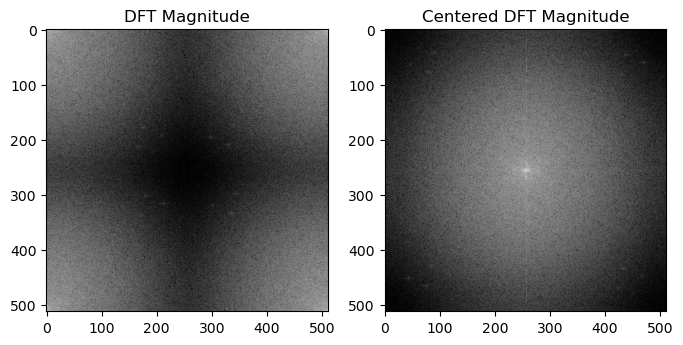

Variance: 5, Filter Size: 2


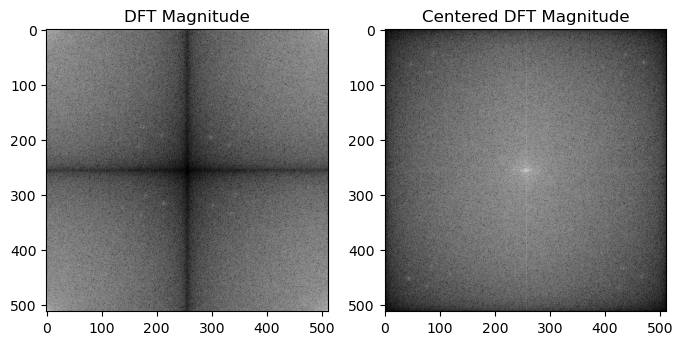

Variance: 5, Filter Size: 10


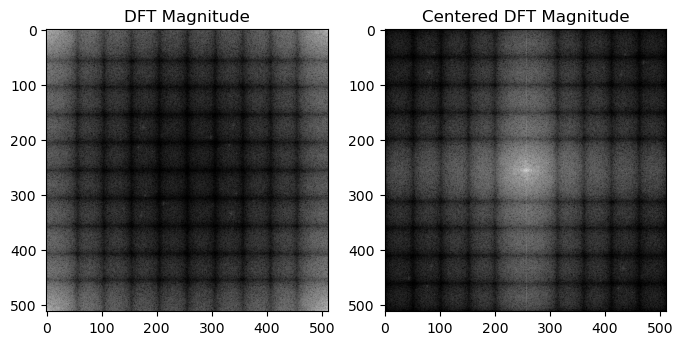

Variance: 5, Filter Size: 30


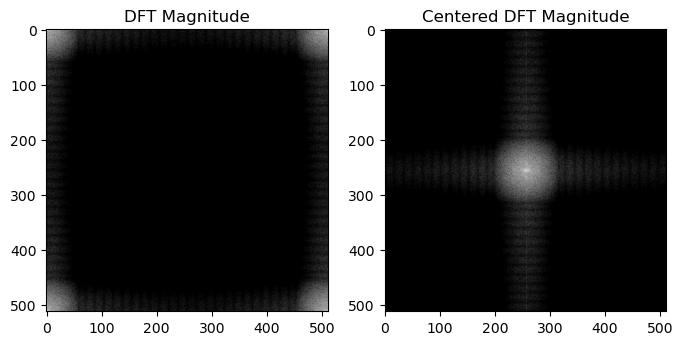

In [12]:
kernal_size = [2, 10, 30]
sigma = [0.5, 1, 5]

for sig in sigma:
    for size in kernal_size:
        print(f'Variance: {sig}, Filter Size: {size}')
        gauss_fil = gauss_filter(size, sig)
        img_cirConvDFT = cirConvDFT(img, gauss_fil) 
        img_mag = np.absolute(img_cirConvDFT)
        img_log = np.log(1 + img_mag)
        img_cent = np.fft.fftshift(img_log)
        fig, axs = plt.subplots(1, 2, figsize=(8, 4))
        axs[0].imshow(img_log, cmap = 'gray')
        axs[0].set_title('DFT Magnitude')
        axs[1].imshow(img_cent, cmap = 'gray')
        axs[1].set_title('Centered DFT Magnitude')
        plt.show() 


The centered DFT spectrum (Bright in the center, dark away from the center) confirms that the Gaussian filter functions as a low-pass filter.

From the centered DFT spectrum, it is evident that increasing the parameter, filter size, and also increasing the parameter, variance, leads to a decrease in the cutoff frequency.

Q3

Filter Size: 2, Variance 1: 1, Variance 2: 1.01


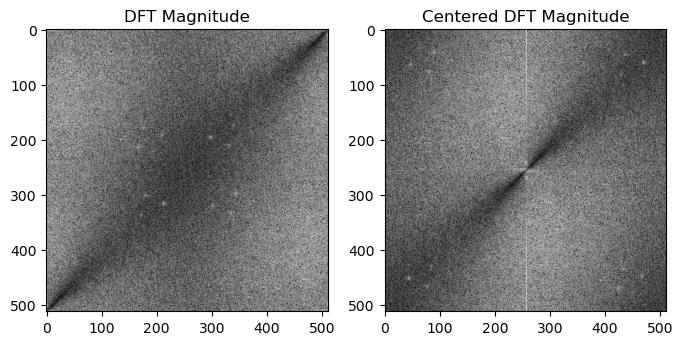

Filter Size: 2, Variance 1: 1, Variance 2: 1.05


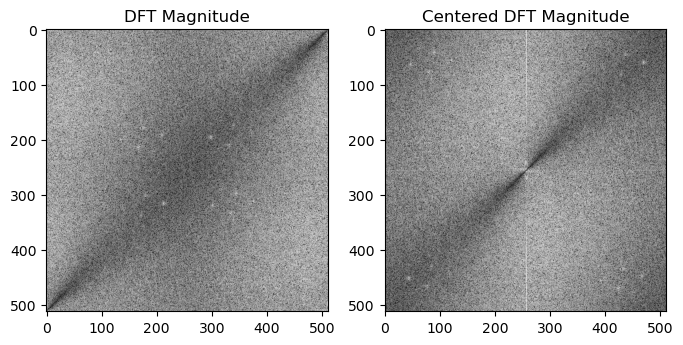

Filter Size: 2, Variance 1: 1, Variance 2: 1.1


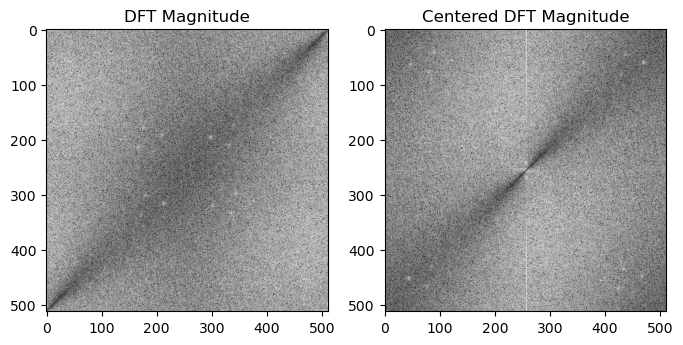

Filter Size: 10, Variance 1: 1, Variance 2: 1.01


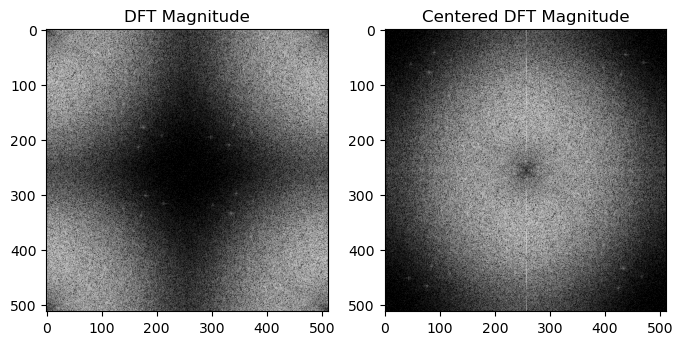

Filter Size: 10, Variance 1: 1, Variance 2: 1.05


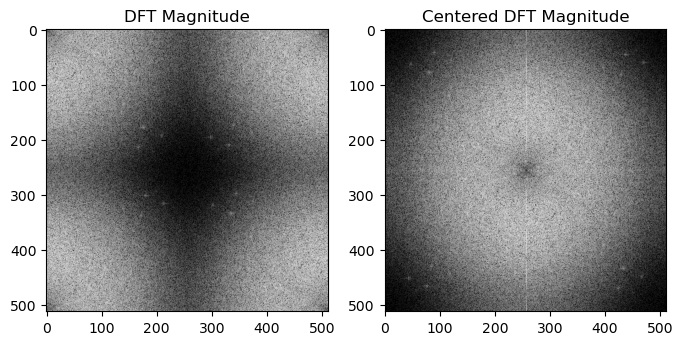

Filter Size: 10, Variance 1: 1, Variance 2: 1.1


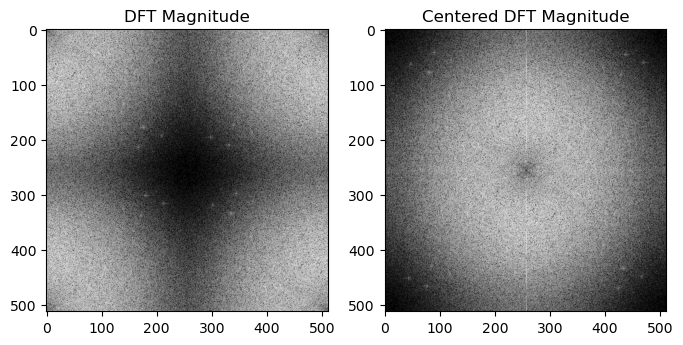

Filter Size: 20, Variance 1: 1, Variance 2: 1.01


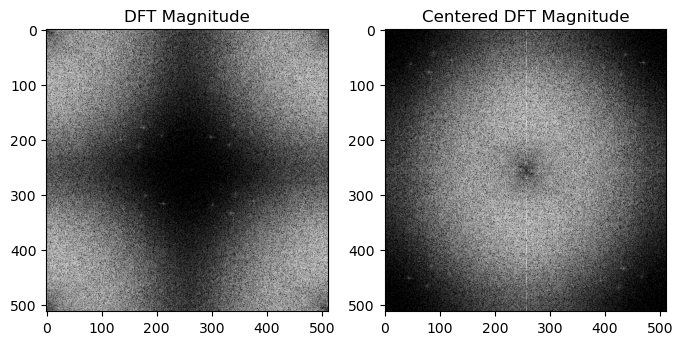

Filter Size: 20, Variance 1: 1, Variance 2: 1.05


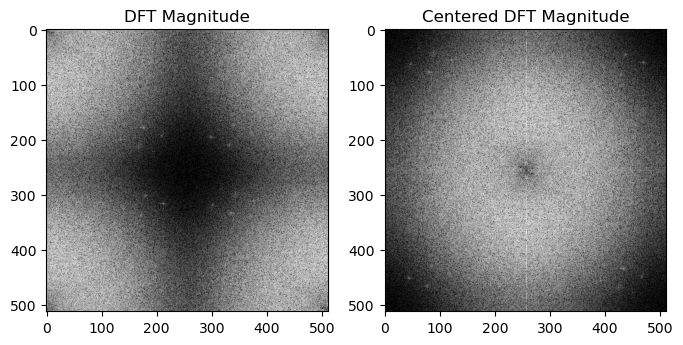

Filter Size: 20, Variance 1: 1, Variance 2: 1.1


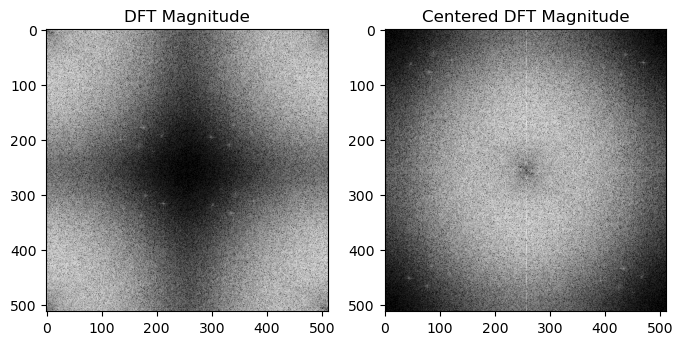

Filter Size: 2, Variance 1: 5, Variance 2: 5.05


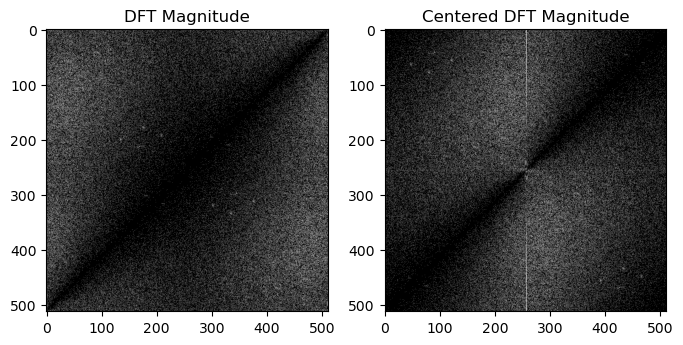

Filter Size: 2, Variance 1: 5, Variance 2: 5.25


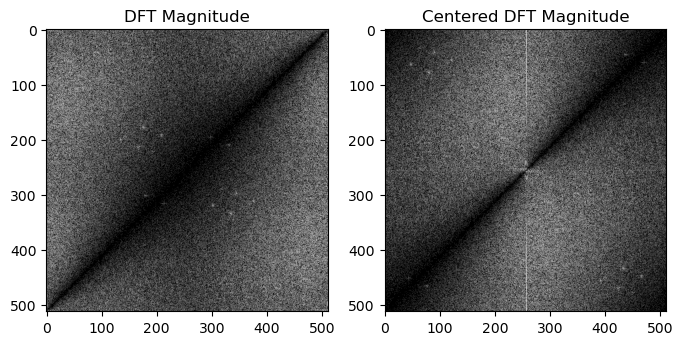

Filter Size: 2, Variance 1: 5, Variance 2: 5.5


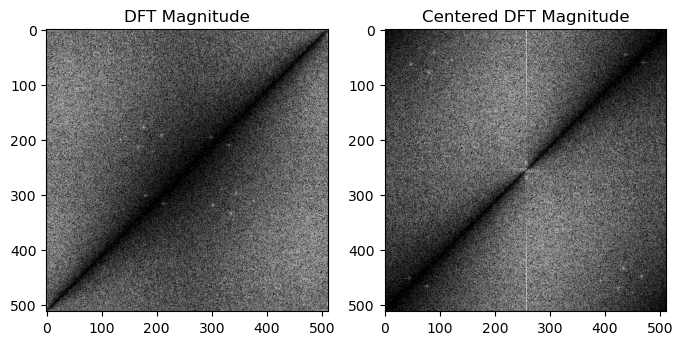

Filter Size: 10, Variance 1: 5, Variance 2: 5.05


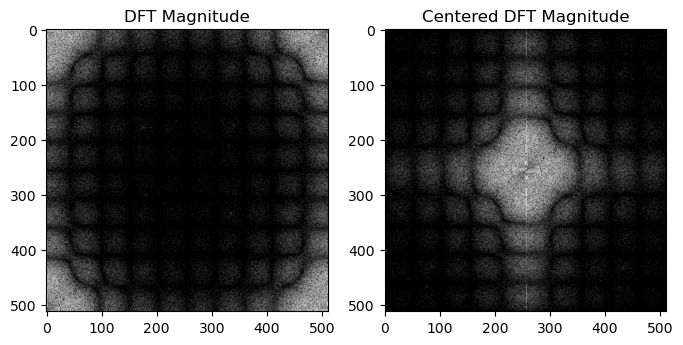

Filter Size: 10, Variance 1: 5, Variance 2: 5.25


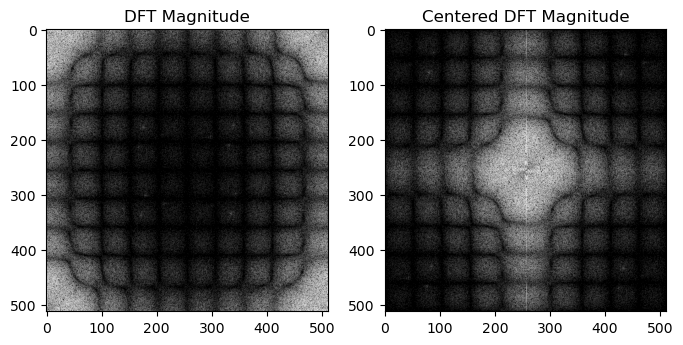

Filter Size: 10, Variance 1: 5, Variance 2: 5.5


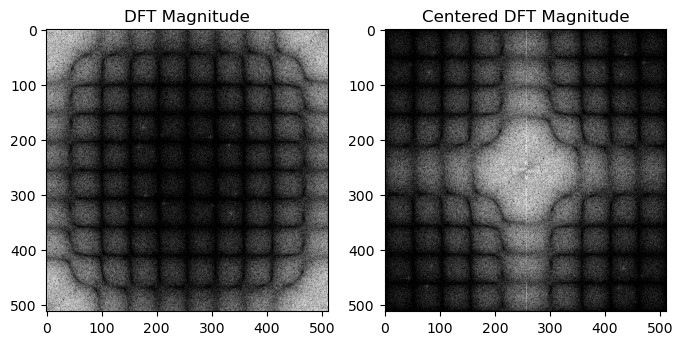

Filter Size: 20, Variance 1: 5, Variance 2: 5.05


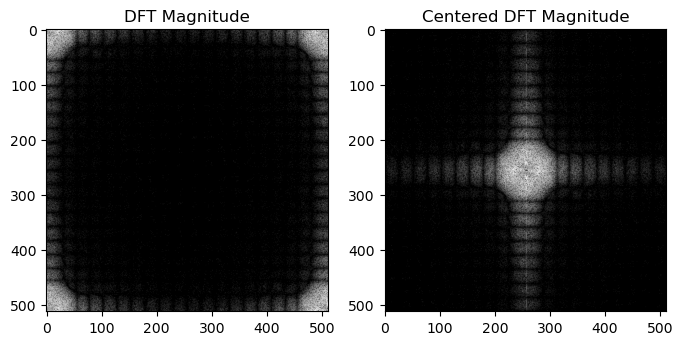

Filter Size: 20, Variance 1: 5, Variance 2: 5.25


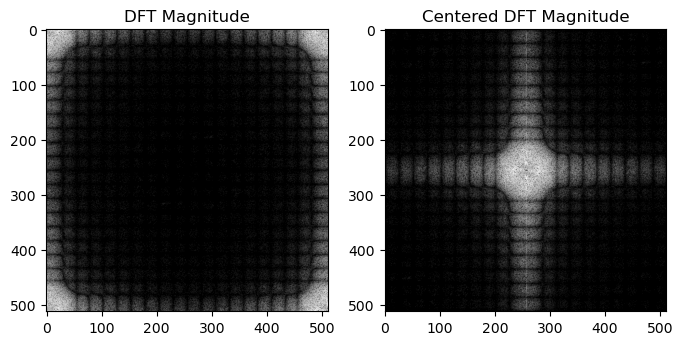

Filter Size: 20, Variance 1: 5, Variance 2: 5.5


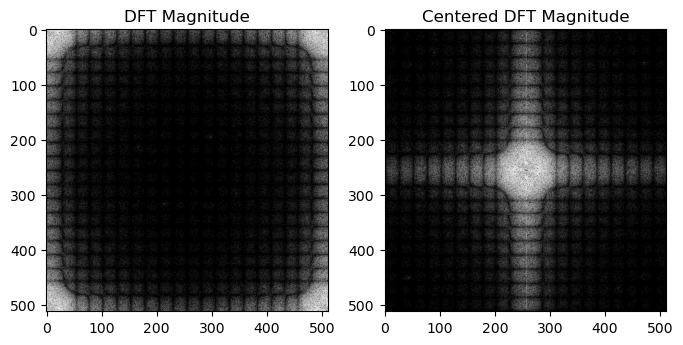

In [13]:
kernal_size = [2, 10, 20]
sigma = [1, 5]
diff = [0.01, 0.05, 0.1]

for sig in sigma:
    for size in kernal_size:
        for d in diff:
            print(f'Filter Size: {size}, Variance 1: {sig}, Variance 2: {sig * (d + 1)}')
            gauss_fil1 = gauss_filter(size, sig)
            gauss_fil2 = gauss_filter(size, sig * (d + 1))
            img_cirConvDFT1 = cirConvDFT(img, gauss_fil1) 
            img_cirConvDFT2 = cirConvDFT(img, gauss_fil2) 
            img_cirConvDFT = img_cirConvDFT1 - img_cirConvDFT2
            img_mag = np.absolute(img_cirConvDFT)
            img_log = np.log(1 + img_mag)
            img_cent = np.fft.fftshift(img_log)
            fig, axs = plt.subplots(1, 2, figsize=(8, 4))
            axs[0].imshow(img_log, cmap = 'gray')
            axs[0].set_title('DFT Magnitude')
            axs[1].imshow(img_cent, cmap = 'gray')
            axs[1].set_title('Centered DFT Magnitude')
            plt.show() 


The centered DFT Spectrum (A donut shaped bright area with a dark spot in the center and after a distance) confirms that the diffrence of two gaussian filters gives a band pass filter.

Increasing the diffrence between variances of the two gaussian filters increases the band width of the filter

Q4

In [14]:
def laplace_filter():
    laplace = np.array([[0, 1, 0],
                       [1, -4, 1],
                       [0, 1, 0]]) 

    return laplace

Laplacian Filter Size: 3
Laplacian Filter:
 [[ 0  1  0]
 [ 1 -4  1]
 [ 0  1  0]]


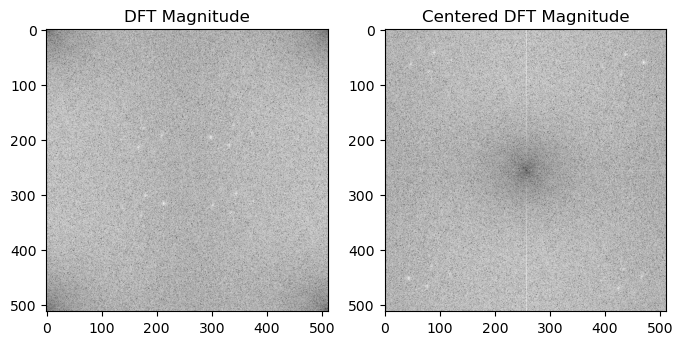

In [15]:
print(f'Laplacian Filter Size: {3}')
lap_fill = laplace_filter()
print(f'Laplacian Filter:\n {lap_fill}')
img_cirConvDFT = cirConvDFT(img, lap_fill) 
img_mag = np.absolute(img_cirConvDFT)
img_log = np.log(1 + img_mag)
img_cent = np.fft.fftshift(img_log)
fig, axs = plt.subplots(1, 2, figsize=(8, 4))
axs[0].imshow(img_log, cmap = 'gray')
axs[0].set_title('DFT Magnitude')
axs[1].imshow(img_cent, cmap = 'gray')
axs[1].set_title('Centered DFT Magnitude')
plt.show() 

The centered DFT Spectrum(Dark in center, bright everywhere else) confirms that the Laplacian filters gives a band pass filter.

Part 3 - Applications of Linear Filters

Q1

In [16]:
img = np.asarray(Image.open(files[1]).convert('L')).astype(int)
img_n = img + np.random.normal(loc = 0,scale = 5, size = img.shape)

a)

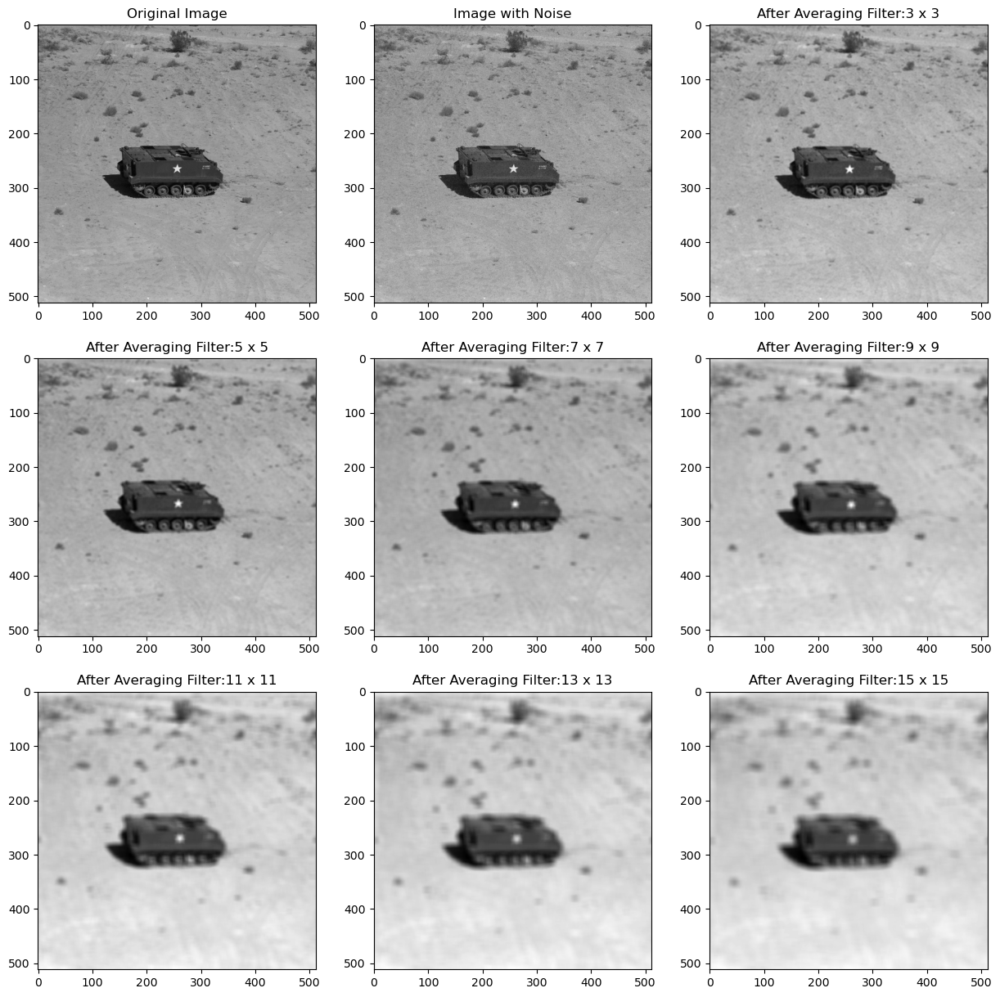

In [17]:
fig, axs = plt.subplots(3, 3, figsize=(15, 15))
axs[0][0].imshow(img, cmap = 'gray')
axs[0][0].set_title('Original Image')
axs[0][1].imshow(img_n, cmap = 'gray')
axs[0][1].set_title('Image with Noise')
i = 2
j = 0
for m in range(3, 16, 2):
    filter = filters(m)
    img_cirConv = DFT_cirConv(img_n, filter) 
    axs[j][i].imshow(img_cirConv, cmap = 'gray')
    axs[j][i].set_title(f'After Averaging Filter:{m} x {m}')
    i += 1
    if i % 3 == 0:
        i = 0
        j += 1
plt.show() 

As the filter size increases the image becomes smoother and smoother, but the does not seem to become much sharper after filter size 3, but becomes much smoother.

The Optimal filter size is taken to be 3.

b)

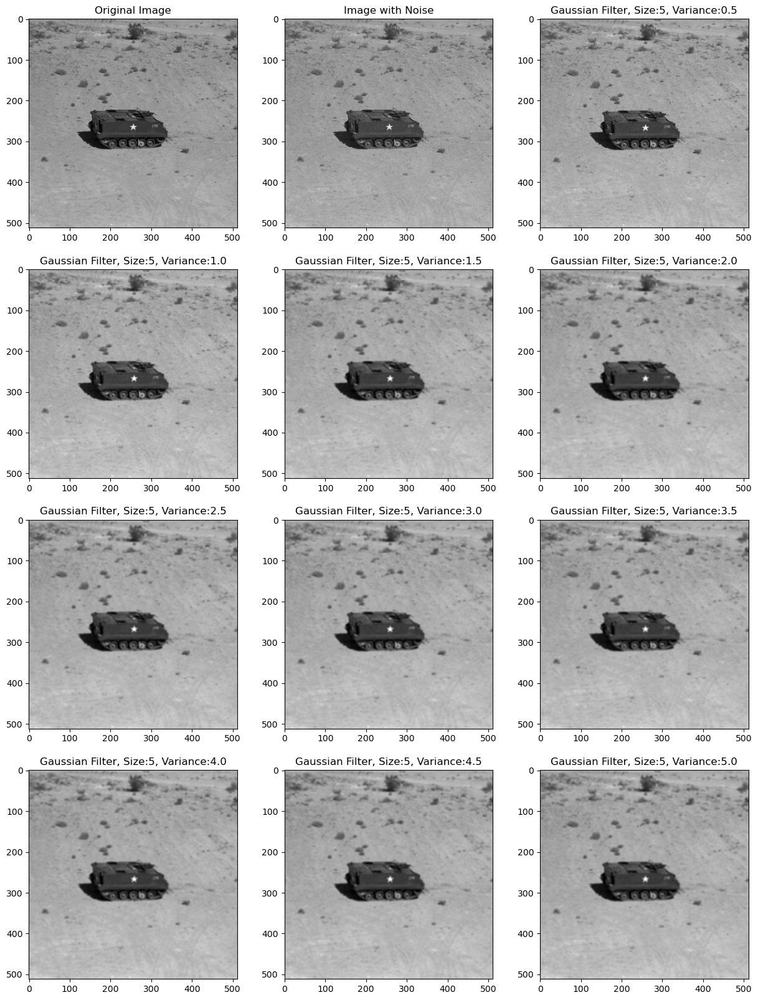

In [18]:
fig, axs = plt.subplots(4, 3, figsize=(15, 20))
axs[0][0].imshow(img, cmap = 'gray')
axs[0][0].set_title('Original Image')
axs[0][1].imshow(img_n, cmap = 'gray')
axs[0][1].set_title('Image with Noise')
i = 2
j = 0
for sig in np.arange(0.5, 5.1, 0.5):
    gauss_fil = gauss_filter(5, sig)
    img_cirConv = DFT_cirConv(img_n, gauss_fil) 
    axs[j][i].imshow(img_cirConv, cmap = 'gray')
    axs[j][i].set_title(f'Gaussian Filter, Size:{5}, Variance:{sig}')
    i += 1
    if i % 3 == 0:
        j += 1
        i = 0
plt.show() 

Increasing the variance of the gaussian filter decreases the noise but tends to make the image more smoother.

The increasing variance results in a broader kernel causing extensive averaging to neighbour pixels.

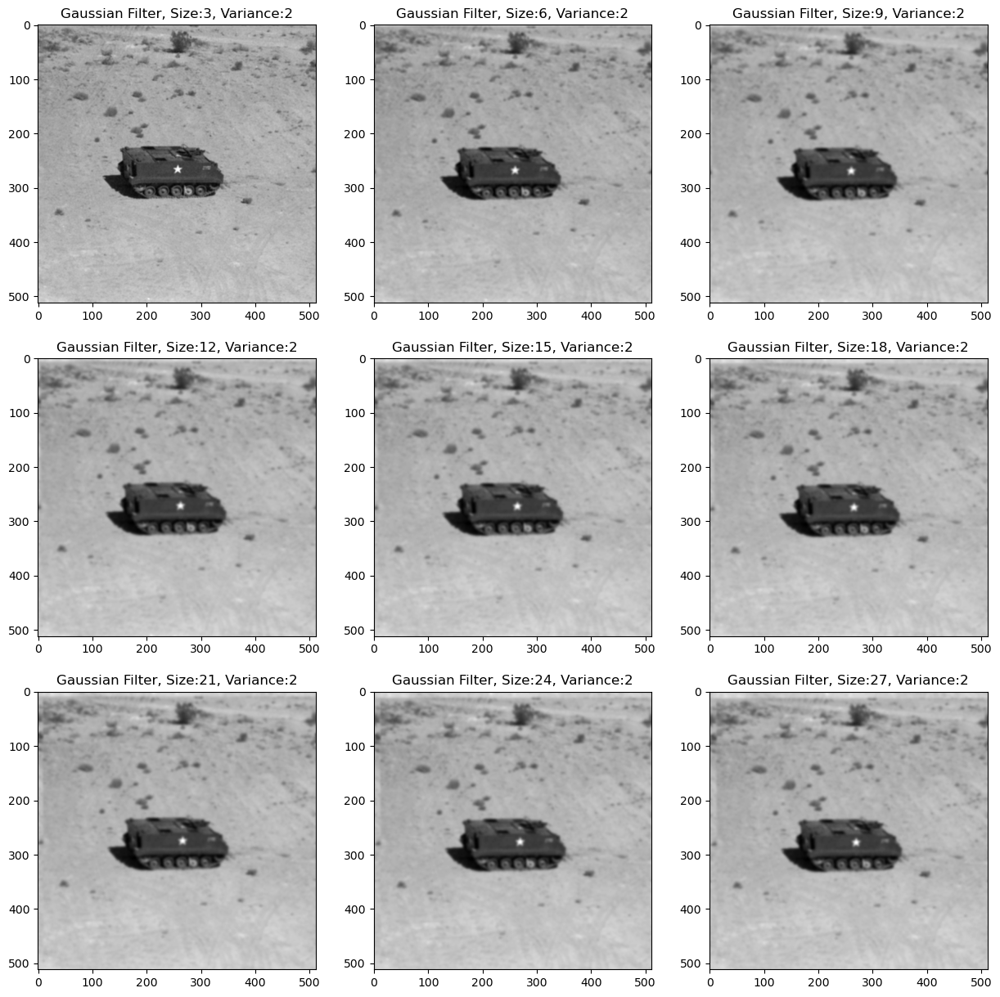

In [19]:
fig, axs = plt.subplots(3, 3, figsize=(15,15))
i = 0
j = 0
for size in range(3, 30, 3):
    gauss_fil = gauss_filter(size, 2)
    img_cirConv = DFT_cirConv(img_n, gauss_fil) 
    axs[j][i].imshow(img_cirConv, cmap = 'gray')
    axs[j][i].set_title(f'Gaussian Filter, Size:{size}, Variance:{2}')
    i += 1
    if i % 3 == 0:
        j += 1
        i = 0
plt.show() 

The effect is the same where the noise decreases but the image becomes much smoother.

Larger kernel sizes result in a more extensive spatial averaging of pixel values.

Q2

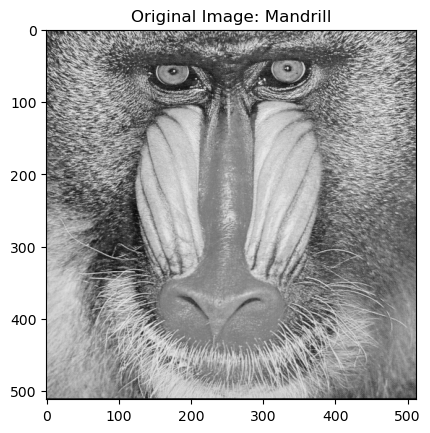

In [20]:
img = np.asarray(Image.open(files[2]).convert('L')).astype(int)
plt.imshow(img, cmap = 'gray')
plt.title('Original Image: Mandrill')
plt.show()

Band Pass Filter; Diffrence of 2 Gaussian filters


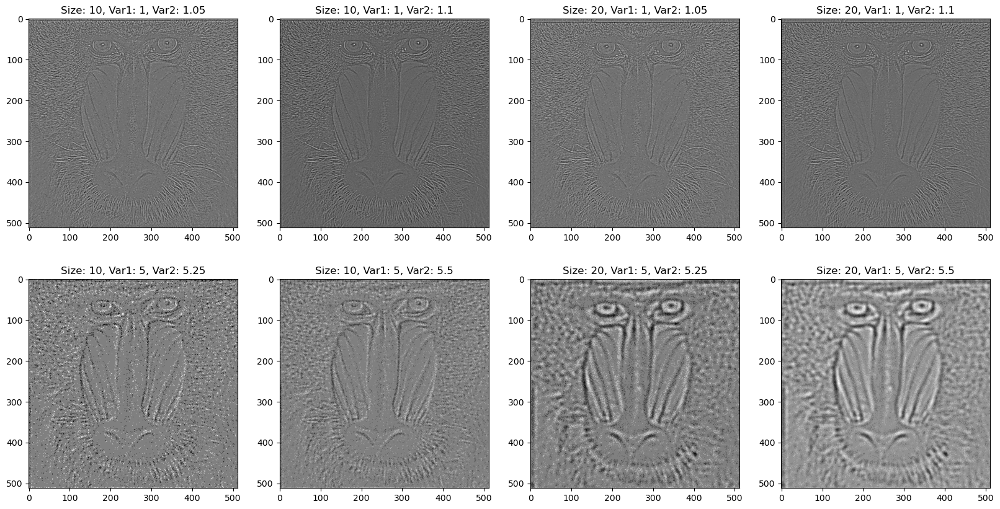

In [21]:
kernal_size = [10, 20]
sigma = [1, 5]
diff = [0.05, 0.1]
fig, axs = plt.subplots(2, 4, figsize=(20, 10))
i = 0
j = 0
print('Band Pass Filter; Diffrence of 2 Gaussian filters')
for sig in sigma:
    for size in kernal_size:
        for d in diff:
            gauss_fil1 = gauss_filter(size, sig)
            gauss_fil2 = gauss_filter(size, sig * (d + 1))
            img_cirConv1 = DFT_cirConv(img, gauss_fil1) 
            img_cirConv2 = DFT_cirConv(img, gauss_fil2) 
            img_band = (img_cirConv1 - img_cirConv2)   
            axs[j][i].imshow(img_band, cmap = 'gray')
            axs[j][i].set_title(f'Size: {size}, Var1: {sig}, Var2: {sig * (d + 1)}')
            i += 1
            if i % 4 == 0:
                i = 0
                j += 1
plt.show() 

When the diffrence in variance is low the frequencies in the output are almost same causing almost a uniform(smooth) output.

With increasing kernal size the frequency bands(Frequencies between the maximum and minimum frequecy) which are in the output image decreases, i.e, the value of both maximum and minimum frequency decreases.

High Pass Filter; Laplacian Filter
Laplacian Filter Size: 3
Laplacian Filter:
 [[ 0  1  0]
 [ 1 -4  1]
 [ 0  1  0]]


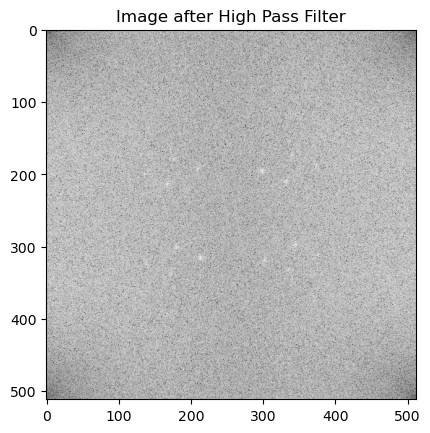

In [22]:
print('High Pass Filter; Laplacian Filter')
print(f'Laplacian Filter Size: {3}')
lap_fill = laplace_filter()
print(f'Laplacian Filter:\n {lap_fill}')
img_cirConv = DFT_cirConv(img, lap_fill) 
plt.imshow(img_log, cmap = 'gray')
plt.title('Image after High Pass Filter')
plt.show() 

Only high frequecies are present in the output.